In [1]:
!pip install shap --user


In [2]:
!pip install lime


In [3]:
import pandas as pd
import numpy as np
import random
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import load_wine
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import precision_score, recall_score, f1_score,confusion_matrix
from sklearn.ensemble import AdaBoostClassifier
#FOR LIME
from lime import lime_tabular 
#FOR PDP
from sklearn.inspection import plot_partial_dependence
#for shap
import shap


In [4]:
dataset = pd.read_csv('modified_dataset.csv')

In [5]:
dataset.head(10)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,dummy
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,NaN
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,NaN
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,NaN
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,NaN
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,NaN
5,5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,...,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0,NaN
6,6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,...,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0,NaN
7,7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,...,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0,NaN
8,8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,...,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0,NaN
9,9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,...,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0,NaN


In [6]:
dataset.isnull().sum()

Unnamed: 0                     0
trans_date_trans_time          0
cc_num                         0
merchant                       0
category                       0
amt                         1310
first                          0
last                           0
gender                         0
street                         0
city                           0
state                          0
zip                            0
lat                            0
long                           0
city_pop                       0
job                            0
dob                            0
trans_num                      0
unix_time                      0
merch_lat                      0
merch_long                     0
is_fraud                       0
dummy                    1295446
dtype: int64

In [7]:
#drop the dummy column that added previously 
dataset = dataset.drop(['dummy'],axis=1) #Axis = 1 means column removed

In [8]:
dataset.isnull().sum()

Unnamed: 0                  0
trans_date_trans_time       0
cc_num                      0
merchant                    0
category                    0
amt                      1310
first                       0
last                        0
gender                      0
street                      0
city                        0
state                       0
zip                         0
lat                         0
long                        0
city_pop                    0
job                         0
dob                         0
trans_num                   0
unix_time                   0
merch_lat                   0
merch_long                  0
is_fraud                    0
dtype: int64

In [9]:
dataset = dataset[dataset['amt'].notnull()]

In [10]:
dataset.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [11]:
dataset.shape

(1295365, 23)

In [12]:
dataset.is_fraud.sum()

7500

In [13]:
dataset.keys() #merchant, category, first, last, gender, street, city, state, job

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

# Encoding

In [14]:
# merchant encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['merchant_enc'] = enc.fit_transform(dataset['merchant'])
# Compare the two columns
dataset[['merchant','merchant_enc']]

,merchant,merchant_enc
0,"fraud_Rippin, Kub and Mann",514
1,"fraud_Heller, Gutmann and Zieme",241
2,fraud_Lind-Buckridge,390
3,"fraud_Kutch, Hermiston and Farrell",360
4,fraud_Keeling-Crist,297
...,...,...
1296670,fraud_Reichel Inc,499
1296671,fraud_Abernathy and Sons,2
1296672,fraud_Stiedemann Ltd,599
1296673,"fraud_Reinger, Weissnat and Strosin",509


In [15]:
# category encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['category_enc'] = enc.fit_transform(dataset['category'])
# Compare the two columns
dataset[['category','category_enc']]

,category,category_enc
0,misc_net,8
1,grocery_pos,4
2,entertainment,0
3,gas_transport,2
4,misc_pos,9
...,...,...
1296670,entertainment,0
1296671,food_dining,1
1296672,food_dining,1
1296673,food_dining,1


In [16]:
# first encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['first_enc'] = enc.fit_transform(dataset['first'])
# Compare the two columns
dataset[['first','first_enc']]

,first,first_enc
0,Jennifer,162
1,Stephanie,309
2,Edward,115
3,Jeremy,163
4,Tyler,336
...,...,...
1296670,Erik,121
1296671,Jeffrey,160
1296672,Christopher,74
1296673,Joseph,179


In [17]:
# last encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['last_enc'] = enc.fit_transform(dataset['last'])
# Compare the two columns
dataset[['last','last_enc']]

,last,last_enc
0,Banks,18
1,Gill,157
2,Sanchez,381
3,White,463
4,Garcia,149
...,...,...
1296670,Patterson,332
1296671,White,463
1296672,Castaneda,67
1296673,Murray,304


In [18]:
# gender encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['gender_enc'] = enc.fit_transform(dataset['gender'])
# Compare the two columns
dataset[['gender','gender_enc']]

,gender,gender_enc
0,F,0
1,F,0
2,M,1
3,M,1
4,M,1
...,...,...
1296670,M,1
1296671,M,1
1296672,M,1
1296673,M,1


In [19]:
# street encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['street_enc'] = enc.fit_transform(dataset['street'])
# Compare the two columns
dataset[['street','street_enc']]

,street,street_enc
0,561 Perry Cove,568
1,43039 Riley Greens Suite 393,435
2,594 White Dale Suite 530,602
3,9443 Cynthia Court Apt. 038,930
4,408 Bradley Rest,418
...,...,...
1296670,162 Jessica Row Apt. 072,154
1296671,8617 Holmes Terrace Suite 651,856
1296672,1632 Cohen Drive Suite 639,158
1296673,42933 Ryan Underpass,433


In [20]:
# city encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['city_enc'] = enc.fit_transform(dataset['city'])
# Compare the two columns
dataset[['city','city_enc']]

,city,city_enc
0,Moravian Falls,526
1,Orient,612
2,Malad City,468
3,Boulder,84
4,Doe Hill,216
...,...,...
1296670,Hatch,330
1296671,Tuscarora,813
1296672,High Rolls Mountain Park,346
1296673,Manderson,471


In [21]:
# state encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['state_enc'] = enc.fit_transform(dataset['state'])
# Compare the two columns
dataset[['state','state_enc']]

,state,state_enc
0,NC,27
1,WA,47
2,ID,13
3,MT,26
4,VA,45
...,...,...
1296670,UT,44
1296671,MD,20
1296672,NM,32
1296673,SD,41


In [22]:
# job encoding
enc = LabelEncoder()
# Apply the encoding to the "Accessible" column
dataset['job_enc'] = enc.fit_transform(dataset['job'])
# Compare the two columns
dataset[['job','job_enc']]

,job,job_enc
0,"Psychologist, counselling",370
1,Special educational needs teacher,428
2,Nature conservation officer,307
3,Patent attorney,328
4,Dance movement psychotherapist,116
...,...,...
1296670,Geoscientist,215
1296671,"Production assistant, television",360
1296672,Naval architect,308
1296673,Volunteer coordinator,485


# Engineering numerical features - datetime


In [23]:
dataset['trans_date_trans_time'] = pd.to_datetime(dataset['trans_date_trans_time'])

# Extract the month using the .dt accessor
dataset['Month'] = dataset['trans_date_trans_time'].dt.month

In [24]:
dataset.keys()

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'merchant_enc', 'category_enc',
       'first_enc', 'last_enc', 'gender_enc', 'street_enc', 'city_enc',
       'state_enc', 'job_enc', 'Month'],
      dtype='object')

In [25]:
encoded_dataset = dataset[['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'merchant_enc', 'category_enc',
       'first_enc', 'last_enc', 'gender_enc', 'street_enc', 'city_enc', 'state_enc', 'job_enc', 'Month']]

# Correlation

In [26]:
dcorr = encoded_dataset.corr()
dcorr

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,merchant_enc,category_enc,first_enc,last_enc,gender_enc,street_enc,city_enc,state_enc,job_enc,Month
cc_num,1.000000,0.001788,0.041494,-0.059252,-0.048298,-0.008969,0.000369,-0.058924,-0.048271,-0.000998,0.000092,0.001277,-0.027165,0.006872,0.001177,0.046514,0.049191,-0.036342,0.029192,-0.000273
amt,0.001788,1.000000,0.001855,-0.001902,-0.000190,0.005825,-0.000315,-0.001851,-0.000156,0.219427,-0.002633,0.030874,-0.003563,-0.004690,0.000996,0.001391,-0.000574,0.001749,-0.000612,-0.001735
zip,0.041494,0.001855,1.000000,-0.114256,-0.909742,0.078510,0.000734,-0.113530,-0.908934,-0.002161,0.001099,0.002354,0.004731,0.028269,-0.065955,-0.053841,0.074773,-0.116230,-0.005740,0.000853
lat,-0.059252,-0.001902,-0.114256,1.000000,-0.015559,-0.155751,0.000612,0.993592,-0.015535,0.001899,-0.002227,-0.008646,0.131886,-0.034882,0.042940,-0.012666,-0.032030,0.213321,-0.027549,-0.001109
long,-0.048298,-0.000190,-0.909742,-0.015559,1.000000,-0.052749,-0.000698,-0.015473,0.999119,0.001724,-0.000678,-0.000760,-0.016460,-0.025539,0.050438,0.071328,-0.066705,0.132419,-0.002692,-0.001213
city_pop,-0.008969,0.005825,0.078510,-0.155751,-0.052749,1.000000,-0.001740,-0.154796,-0.052721,0.002151,0.001933,0.009377,-0.066629,-0.012000,-0.028659,-0.012532,0.034913,-0.012211,-0.054974,0.000092
unix_time,0.000369,-0.000315,0.000734,0.000612,-0.000698,-0.001740,1.000000,0.000546,-0.000690,-0.005120,-0.001003,0.000165,0.000490,0.000124,-0.000928,-0.001104,-0.000443,0.001091,0.000015,0.184856
merch_lat,-0.058924,-0.001851,-0.113530,0.993592,-0.015473,-0.154796,0.000546,1.000000,-0.015452,0.001741,-0.002223,-0.008511,0.130978,-0.034518,0.042648,-0.012535,-0.031805,0.211895,-0.027367,-0.001149
merch_long,-0.048271,-0.000156,-0.908934,-0.015535,0.999119,-0.052721,-0.000690,-0.015452,1.000000,0.001725,-0.000654,-0.000731,-0.016475,-0.025539,0.050383,0.071285,-0.066719,0.132299,-0.002691,-0.001196
is_fraud,-0.000998,0.219427,-0.002161,0.001899,0.001724,0.002151,-0.005120,0.001741,0.001725,1.000000,-0.000498,0.020178,-0.003204,-0.000119,0.007603,0.001430,-0.002110,0.001710,-0.000059,-0.012422


<AxesSubplot:>

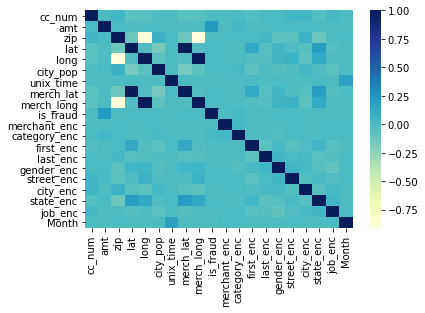

In [27]:
sns.heatmap(dcorr, cmap = 'YlGnBu')

In [28]:
# Removing zip, long, merch_long Colomns 
encoded_dataset2 = dataset[['cc_num', 'amt', 'lat', 'city_pop', 'dob', 'trans_num', 'unix_time', 'is_fraud', 'merchant_enc', 'category_enc',
       'first_enc', 'last_enc', 'gender_enc', 'street_enc', 'city_enc', 'state_enc', 'job_enc', 'Month']]

In [29]:
dcorr2 = encoded_dataset2.corr()
dcorr2

,cc_num,amt,lat,city_pop,unix_time,is_fraud,merchant_enc,category_enc,first_enc,last_enc,gender_enc,street_enc,city_enc,state_enc,job_enc,Month
cc_num,1.000000,0.001788,-0.059252,-0.008969,0.000369,-0.000998,0.000092,0.001277,-0.027165,0.006872,0.001177,0.046514,0.049191,-0.036342,0.029192,-0.000273
amt,0.001788,1.000000,-0.001902,0.005825,-0.000315,0.219427,-0.002633,0.030874,-0.003563,-0.004690,0.000996,0.001391,-0.000574,0.001749,-0.000612,-0.001735
lat,-0.059252,-0.001902,1.000000,-0.155751,0.000612,0.001899,-0.002227,-0.008646,0.131886,-0.034882,0.042940,-0.012666,-0.032030,0.213321,-0.027549,-0.001109
city_pop,-0.008969,0.005825,-0.155751,1.000000,-0.001740,0.002151,0.001933,0.009377,-0.066629,-0.012000,-0.028659,-0.012532,0.034913,-0.012211,-0.054974,0.000092
unix_time,0.000369,-0.000315,0.000612,-0.001740,1.000000,-0.005120,-0.001003,0.000165,0.000490,0.000124,-0.000928,-0.001104,-0.000443,0.001091,0.000015,0.184856
is_fraud,-0.000998,0.219427,0.001899,0.002151,-0.005120,1.000000,-0.000498,0.020178,-0.003204,-0.000119,0.007603,0.001430,-0.002110,0.001710,-0.000059,-0.012422
merchant_enc,0.000092,-0.002633,-0.002227,0.001933,-0.001003,-0.000498,1.000000,0.032307,-0.001572,-0.000395,-0.000958,0.000753,-0.000340,-0.000437,0.001371,0.000409
category_enc,0.001277,0.030874,-0.008646,0.009377,0.000165,0.020178,0.032307,1.000000,-0.001941,-0.004320,-0.028278,0.002263,0.000718,0.000267,0.003494,0.000743
first_enc,-0.027165,-0.003563,0.131886,-0.066629,0.000490,-0.003204,-0.001572,-0.001941,1.000000,-0.057001,0.015207,-0.045367,-0.009177,0.043128,-0.039687,0.000114
last_enc,0.006872,-0.004690,-0.034882,-0.012000,0.000124,-0.000119,-0.000395,-0.004320,-0.057001,1.000000,0.043737,0.005605,0.017562,-0.048162,-0.024617,0.001166


<AxesSubplot:>

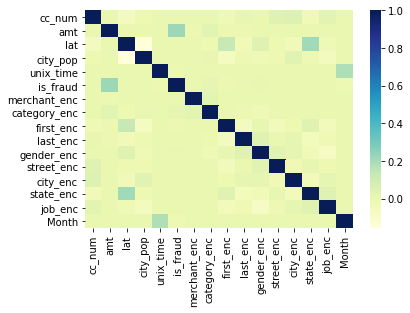

In [30]:
sns.heatmap(dcorr2, cmap = 'YlGnBu')

# Test train split

In [31]:
X_train, X_test, y_train, y_test = train_test_split(dataset[['cc_num', 'amt', 'lat', 'city_pop', 'unix_time', 'merchant_enc',
                            'category_enc', 'first_enc', 'last_enc', 'gender_enc', 'street_enc', 'city_enc', 'state_enc',
                            'job_enc', 'Month']], dataset['is_fraud'], test_size=0.25, random_state=0)

In [32]:
X_train

,cc_num,amt,lat,city_pop,unix_time,merchant_enc,category_enc,first_enc,last_enc,gender_enc,street_enc,city_enc,state_enc,job_enc,Month
1002728,3576021480694169,204.88,39.1329,163415,1360968161,32,12,94,166,0,934,806,16,416,2
916516,4935858973307492,106.37,32.8088,1841,1356836527,149,8,211,441,1,605,379,10,193,12
1131199,2475085306462014,77.37,44.2378,1507,1366065982,338,10,174,288,1,147,427,23,260,4
414580,375767678113375,174.00,38.6476,4367,1341595843,606,7,74,332,1,162,801,45,488,7
69448,3596217206093829,14.87,40.8626,888,1328914588,10,1,292,353,0,230,74,12,60,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360141,376028110684021,66.57,39.7795,964,1339879647,210,0,0,304,1,628,495,24,473,6
152477,30357372465631,1.20,43.6718,1628,1332495409,491,12,174,310,1,7,194,48,84,3
964388,4451952084362894,66.52,34.5444,686,1359037541,0,0,179,99,1,926,555,43,333,1
118070,60423098130,34.55,36.9412,83,1331160074,619,0,157,166,1,871,20,36,45,3


In [33]:
X_test

,cc_num,amt,lat,city_pop,unix_time,merchant_enc,category_enc,first_enc,last_enc,gender_enc,street_enc,city_enc,state_enc,job_enc,Month
891519,180046165512893,114.13,44.8021,9587,1356344445,320,0,120,442,0,81,772,37,156,12
922534,4025612008285111,43.02,41.1762,1274,1356934847,24,2,207,226,0,225,175,38,279,12
395581,30551643947183,99.88,35.1836,5621,1341005896,27,11,252,404,0,137,315,27,475,6
333925,4169759661243568,64.06,40.2236,213,1339121890,273,2,153,61,0,554,434,38,428,6
559124,4906628655840914250,47.62,24.6557,32891,1345968925,563,4,66,296,1,835,405,9,474,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348526,4451952084362894,71.06,34.5444,686,1339540163,145,0,179,99,1,926,555,43,333,6
801356,343746486082492,15.58,44.8605,3096,1354640441,628,5,160,302,1,828,132,22,423,12
79304,3513618443244549,66.73,43.7588,355,1329426857,187,6,11,337,0,943,276,41,194,2
1230428,3524574586339330,9.44,27.6330,105638,1369770207,0,0,27,54,0,928,829,9,271,5


In [34]:
y_train

1002728    0
916516     0
1131199    0
414580     0
69448      0
          ..
360141     0
152477     0
964388     0
118070     0
306016     0
Name: is_fraud, Length: 971523, dtype: int64

In [35]:
y_test

891519     0
922534     0
395581     0
333925     0
559124     0
          ..
348526     0
801356     0
79304      0
1230428    0
80317      0
Name: is_fraud, Length: 323842, dtype: int64

# Feature Scalling

In [36]:
#Min max Scaller
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_MinMaxscaled = scaler.transform(X_train)
X_test_MinMaxscaled = scaler.transform(X_test)
X_train_MinMaxscaled
X_test_MinMaxscaled

array([[3.60523363e-05, 3.90805551e-03, 5.30898166e-01, ...,
        7.40000000e-01, 3.16430020e-01, 1.00000000e+00],
       [8.06344616e-04, 1.45157334e-03, 4.53199532e-01, ...,
        7.60000000e-01, 5.65922921e-01, 1.00000000e+00],
       [6.10759464e-06, 3.41579182e-03, 3.24785391e-01, ...,
        5.40000000e-01, 9.63488844e-01, 4.54545455e-01],
       ...,
       [7.03788918e-04, 2.27063103e-03, 5.08541514e-01, ...,
        8.20000000e-01, 3.93509128e-01, 9.09090909e-02],
       [7.05983506e-04, 2.91558282e-04, 1.62985201e-01, ...,
        1.80000000e-01, 5.49695740e-01, 3.63636364e-01],
       [1.32042403e-03, 6.52344384e-03, 4.29917156e-01, ...,
        7.60000000e-01, 1.88640974e-01, 9.09090909e-02]])

In [37]:
X_test_MinMaxscaled.shape

(323842, 15)

# MODEL IMPLEMENTATION


# KNN

In [38]:
# Assuming X_train_MinMaxscaled and y_train are scaled features and target labels
knn = KNeighborsClassifier() #by default 5 neighbors

# Fit the KNN model to the training data
knn.fit(X_train_MinMaxscaled, y_train)


KNeighborsClassifier()

In [39]:
y_pred = knn.predict(X_test_MinMaxscaled)

In [40]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
knn_accuracy_withoutUndersample = (1-error)
print( "Accuracy = %f " % (knn_accuracy_withoutUndersample*100) + '%' )

Error = 0.590103 %
Accuracy = 99.409897 %


In [41]:
knn_cm = confusion_matrix(y_test, y_pred)
print(knn_cm)

[[321806     88]
 [  1823    125]]


<AxesSubplot:>

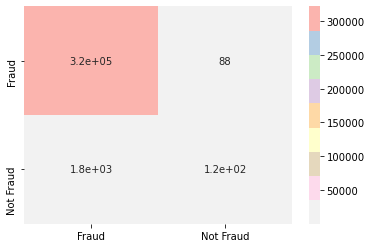

In [42]:
sns.heatmap(knn_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])
# Column Actual val, Row Predicted val

In [43]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are true labels and predicted labels
precision = precision_score(y_test, y_pred) 
recall = recall_score(y_test, y_pred) 
f1 = f1_score(y_test, y_pred)

# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.59
Recall: 0.06
F1 Score: 0.12


In [44]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which we want an explanation
instance_index = 0  # 1st index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, knn.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Model 2: Logistic Regression

In [45]:
logistic_regression = LogisticRegression()
logistic_regression.fit(X_train_MinMaxscaled,y_train)

LogisticRegression()

In [46]:
y_pred = logistic_regression.predict(X_test_MinMaxscaled)

In [47]:
count = 0
for i in range( len(y_test) ):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
lr_accuracy_withoutundersample = (1-error)
print( "Accuracy = %f " % (lr_accuracy_withoutundersample*100) + '%' )

Error = 0.619747 %
Accuracy = 99.380253 %


In [48]:
logistic_regression_cm = confusion_matrix(y_test, y_pred)
print(logistic_regression_cm)

[[321835     59]
 [  1948      0]]


<AxesSubplot:>

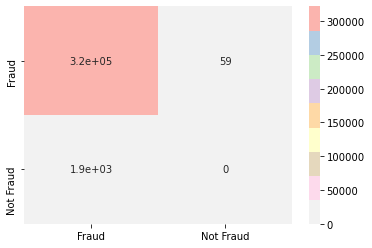

In [49]:
sns.heatmap(logistic_regression_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [51]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = 0  # 1st index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, logistic_regression.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Model 3: Naive Bayes


In [52]:
naive_bayes = GaussianNB()
naive_bayes.fit(X_train_MinMaxscaled, y_train)

GaussianNB()

In [53]:
y_pred = naive_bayes.predict(X_test_MinMaxscaled)

In [54]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
nb_accuracy_withoutundersample = (1-error)
print( "Accuracy = %f " % (nb_accuracy_withoutundersample*100) + '%' )

Error = 1.125858 %
Accuracy = 98.874142 %


In [55]:
naive_bayes_cm = confusion_matrix(y_test, y_pred)
print(naive_bayes_cm)

[[319286   2608]
 [  1038    910]]


<AxesSubplot:>

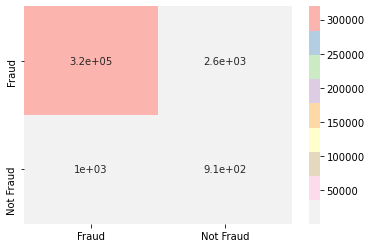

In [56]:
sns.heatmap(naive_bayes_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [57]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are your labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.26
Recall: 0.47
F1 Score: 0.33


In [58]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = 0  # You can choose any index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, naive_bayes.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Decision Tree 

In [59]:
# Create a Decision Tree classifier
decision_tree = DecisionTreeClassifier()

# Train the Decision Tree classifier
decision_tree.fit(X_train_MinMaxscaled, y_train)

DecisionTreeClassifier()

In [60]:
# Make predictions on the test data
y_pred = decision_tree.predict(X_test_MinMaxscaled)

In [61]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
dt_accuracy_withoutundersample = (1-error)
print( "Accuracy = %f " % (dt_accuracy_withoutundersample*100) + '%' )



Error = 0.404827 %
Accuracy = 99.595173 %


In [62]:
decision_tree_cm = confusion_matrix(y_test, y_pred)
print(decision_tree_cm)

[[321184    710]
 [   601   1347]]


<AxesSubplot:>

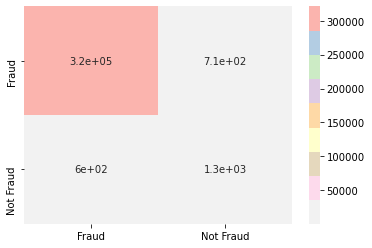

In [63]:
sns.heatmap(decision_tree_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [ ]:
# Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

In [65]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = 0  # 1st index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, decision_tree.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Random Forest

In [66]:
from sklearn.ensemble import RandomForestClassifier

# Assuming X_train_MinMaxscaled and y_train are scaled features and target labels
random_forest = RandomForestClassifier()

# Fit the Random Forest model to the training data
random_forest.fit(X_train_MinMaxscaled, y_train)

RandomForestClassifier()

In [67]:
y_pred = random_forest.predict(X_test_MinMaxscaled)

In [68]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
rf_accuracy_withoutundersample = (1-error)
print( "Accuracy = %f " % (rf_accuracy_withoutundersample*100) + '%' )

Error = 0.249504 %
Accuracy = 99.750496 %


In [69]:
random_forest_cm = confusion_matrix(y_test, y_pred)
print(random_forest_cm)

[[321753    141]
 [   667   1281]]


<AxesSubplot:>

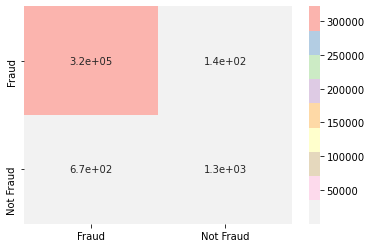

In [70]:
 sns.heatmap(random_forest_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [71]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.90
Recall: 0.66
F1 Score: 0.76


In [72]:
# Fit the Random Forest model to the training data
random_forest = RandomForestClassifier()
random_forest.fit(X_train_MinMaxscaled, y_train)

# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = 0  # 1st index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, random_forest.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Under Sampling

In [73]:
updated_dataset = dataset[['cc_num', 'amt', 'lat', 'city_pop', 'unix_time', 'merchant_enc','category_enc', 'first_enc', 'last_enc', 'gender_enc', 'street_enc', 'city_enc', 'state_enc','job_enc', 'Month','is_fraud']]
fraud = updated_dataset[dataset.is_fraud==1]
not_fraud =  updated_dataset[updated_dataset.is_fraud==0]
sampled_not_fraud = not_fraud.sample(n=fraud.shape[0])            #Sample randomly selects rows and make a dataset
updated_dataset = pd.concat([fraud, sampled_not_fraud])
print(fraud.shape)
updated_dataset.shape

(7500, 16)


(15000, 16)

In [74]:
X_train, X_test, y_train, y_test = train_test_split(updated_dataset[['cc_num', 'amt', 'lat', 'city_pop', 'unix_time', 'merchant_enc',
                            'category_enc', 'first_enc', 'last_enc', 'gender_enc', 'street_enc', 'city_enc', 'state_enc',
                            'job_enc', 'Month']], updated_dataset['is_fraud'], test_size=0.25, random_state=0)

In [75]:
#Min max Scaller
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_MinMaxscaled = scaler.transform(X_train)
X_test_MinMaxscaled = scaler.transform(X_test)
X_train_MinMaxscaled
X_test_MinMaxscaled

array([[7.10818057e-04, 1.51493179e-01, 2.65671942e-01, ...,
        8.60000000e-01, 2.86004057e-01, 2.72727273e-01],
       [7.02271024e-04, 1.60476773e-02, 5.39293964e-01, ...,
        5.20000000e-01, 1.62271805e-01, 9.09090909e-01],
       [4.57436906e-04, 9.99980593e-03, 3.01072296e-01, ...,
        2.00000000e-01, 7.11967546e-01, 3.63636364e-01],
       ...,
       [3.60620019e-05, 1.84153095e-02, 2.93994369e-01, ...,
        8.00000000e-02, 2.47464503e-01, 5.45454545e-01],
       [6.93356997e-05, 1.09031053e-02, 4.43220146e-01, ...,
        6.80000000e-01, 6.79513185e-01, 4.54545455e-01],
       [6.82832080e-05, 4.37712042e-03, 4.81918391e-01, ...,
        4.40000000e-01, 2.73833671e-01, 0.00000000e+00]])

In [76]:
X_test_MinMaxscaled.shape

(3750, 15)

# KNN

In [77]:
# Assuming X_train_MinMaxscaled and y_train are your scaled features and target labels
knn = KNeighborsClassifier()

# Fit the KNN model to the training data
knn.fit(X_train_MinMaxscaled, y_train)

KNeighborsClassifier()

In [78]:
y_pred = knn.predict(X_test_MinMaxscaled)

In [79]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
knn_accuracy = (1-error)
print( "Accuracy = %f " % (knn_accuracy*100) + '%' )

Error = 26.000000 %
Accuracy = 74.000000 %


In [80]:
knn_cm = confusion_matrix(y_test, y_pred)
print(knn_cm)

[[1174  725]
 [ 250 1601]]


<AxesSubplot:>

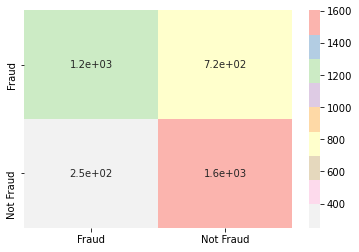

In [81]:
sns.heatmap(knn_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])
# Column Actual val, Row Predicted val

In [82]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are your true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.69
Recall: 0.86
F1 Score: 0.77


In [83]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which I want an explanation
instance_index = random.randint(0, X_test_MinMaxscaled.shape[0])  # randomly any index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, knn.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Logistic Regression

In [84]:
logistic_regression = LogisticRegression()
logistic_regression.fit(X_train_MinMaxscaled,y_train)

LogisticRegression()

In [85]:
y_pred = logistic_regression.predict(X_test_MinMaxscaled)

In [86]:
count = 0
for i in range( len(y_test) ):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
lr_accuracy = (1-error)
print( "Accuracy = %f " % (lr_accuracy*100) + '%' )

Error = 14.880000 %
Accuracy = 85.120000 %


In [87]:
logistic_regression_cm = confusion_matrix(y_test, y_pred)
print(logistic_regression_cm)

[[1819   80]
 [ 478 1373]]


<AxesSubplot:>

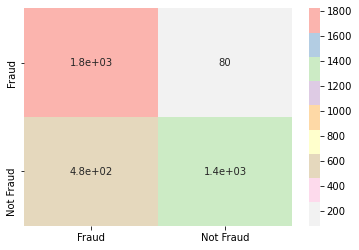

In [88]:
sns.heatmap(logistic_regression_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [89]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are your true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.94
Recall: 0.74
F1 Score: 0.83


In [90]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = random.randint(0, X_test_MinMaxscaled.shape[0])  # randomly any index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, logistic_regression.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Naive Bayes

In [91]:
naive_bayes = GaussianNB()
naive_bayes.fit(X_train_MinMaxscaled, y_train)

GaussianNB()

In [92]:
y_pred = naive_bayes.predict(X_test_MinMaxscaled)

In [93]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
nb_accuracy = (1-error)
print( "Accuracy = %f " % (nb_accuracy*100) + '%' )

Error = 19.600000 %
Accuracy = 80.400000 %


In [94]:
naive_bayes_cm = confusion_matrix(y_test, y_pred)
print(naive_bayes_cm)

[[1805   94]
 [ 641 1210]]


<AxesSubplot:>

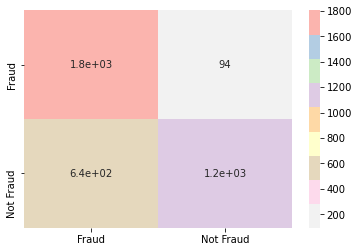

In [95]:
sns.heatmap(naive_bayes_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [96]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are your true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.93
Recall: 0.65
F1 Score: 0.77


In [97]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = random.randint(0, X_test_MinMaxscaled.shape[0])  # randomly any index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, naive_bayes.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Decision tree

In [98]:
# Create a Decision Tree classifier
decision_tree = DecisionTreeClassifier()

# Train the Decision Tree classifier
decision_tree.fit(X_train_MinMaxscaled, y_train)

DecisionTreeClassifier()

In [99]:
# Make predictions on the test data
y_pred = decision_tree.predict(X_test_MinMaxscaled)

In [100]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
dt_accuracy= (1-error)
print( "Accuracy = %f " % (dt_accuracy*100) + '%' )


Error = 4.933333 %
Accuracy = 95.066667 %


In [101]:
decision_tree_cm = confusion_matrix(y_test, y_pred)
print(decision_tree_cm)

[[1808   91]
 [  94 1757]]


<AxesSubplot:>

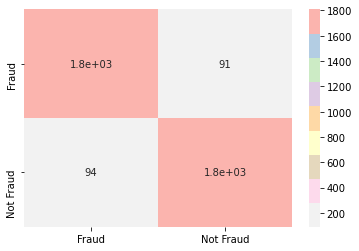

In [102]:
sns.heatmap(decision_tree_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [103]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are your true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.95
Recall: 0.95
F1 Score: 0.95


In [104]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = random.randint(0, X_test_MinMaxscaled.shape[0])  # randomly any index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, decision_tree.predict_proba)

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Random Forest

In [105]:
# Assuming X_train_MinMaxscaled and y_train are your scaled features and target labels
random_forest = RandomForestClassifier()

# Fit the Random Forest model to the training data
random_forest.fit(X_train_MinMaxscaled, y_train)

RandomForestClassifier()

In [106]:
y_pred = random_forest.predict(X_test_MinMaxscaled)

In [107]:
count = 0
for i in range(len(y_test)):
    if y_pred[i] != y_test.iloc[i]: 
        count = count + 1
error = count/len(y_pred)
print( "Error = %f " % (error*100) + '%' )
rf_accuracy= (1-error)
print( "Accuracy = %f " % (rf_accuracy*100) + '%' )

Error = 5.066667 %
Accuracy = 94.933333 %


In [108]:
random_forest_cm = confusion_matrix(y_test, y_pred)
print(random_forest_cm)

[[1834   65]
 [ 125 1726]]


<AxesSubplot:>

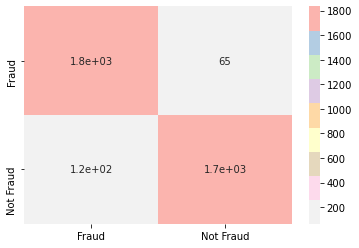

In [109]:
sns.heatmap(random_forest_cm, annot=True, cmap='Pastel1_r', xticklabels=['Fraud' ,'Not Fraud'],yticklabels=['Fraud' ,'Not Fraud'])

In [110]:
#Model evaluation (precision, recall, F1 score)
# Assuming y_test and y_pred are your true labels and predicted labels
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
# Display the results
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))

Precision: 0.96
Recall: 0.93
F1 Score: 0.95


In [111]:
# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_MinMaxscaled, feature_names=X_train.columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)

# Choose an instance from the test set for which you want an explanation
instance_index = random.randint(0, X_test_MinMaxscaled.shape[0])  # randomly any index from the test set
instance = X_test_MinMaxscaled[instance_index]

# Generate an explanation for the instance
explanation = explainer.explain_instance(instance, random_forest.predict_proba, num_features=len(X_train.columns))

# Display the results
explanation.show_in_notebook(show_table=True, show_all=False)

# Comparison

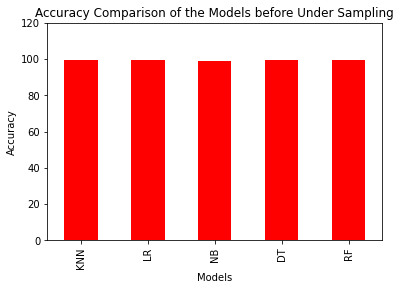

In [112]:
# WithOut Undersampling

accuracy = {'Model': ['KNN', 'LR', 'NB', 'DT', 'RF'],
        'Accuracy': [knn_accuracy_withoutUndersample*100, lr_accuracy_withoutundersample*100, nb_accuracy_withoutundersample*100, dt_accuracy_withoutundersample*100, rf_accuracy_withoutundersample*100]}
df = pd.DataFrame(accuracy)
ax = df.plot(kind='bar', x='Model', y='Accuracy', color='red', legend=False)
ax.set_ylim([0, 120])
ax.set_title('Accuracy Comparison of the Models before Under Sampling')
ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
plt.show()

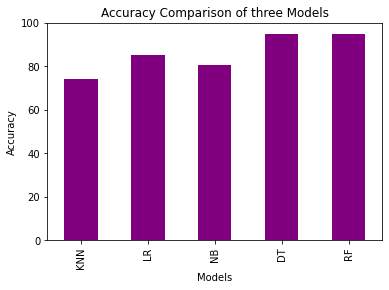

In [113]:
accuracy2 = {'Model': ['KNN', 'LR', 'NB', 'DT', 'RF'],
        'Accuracy': [knn_accuracy*100, lr_accuracy*100, nb_accuracy*100, dt_accuracy*100, rf_accuracy*100]}
df = pd.DataFrame(accuracy2)
ax = df.plot(kind='bar', x='Model', y='Accuracy', color='purple', legend=False)
ax.set_ylim([0, 100])
ax.set_title('Accuracy Comparison of three Models')
ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
plt.show()

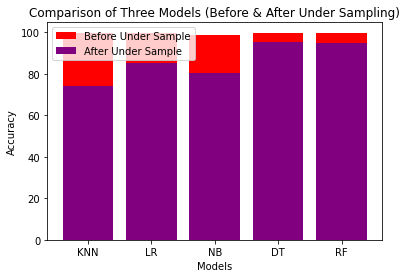

In [114]:
dict1 = {'KNN':knn_accuracy_withoutUndersample*100, 'LR':lr_accuracy_withoutundersample*100, 'NB':nb_accuracy_withoutundersample*100, 'DT': dt_accuracy_withoutundersample*100, 'RF': rf_accuracy_withoutundersample*100}

dict2 ={'KNN':knn_accuracy*100, 'LR':lr_accuracy*100, 'NB':nb_accuracy*100, 'DT': dt_accuracy*100, 'RF': rf_accuracy*100 }

keys = list(dict1.keys())
values_dict1 = list(dict1.values())
values_dict2 = list(dict2.values())

plt.bar(keys, values_dict1, label='Before Under Sample', color='red')
plt.bar(keys, values_dict2, label='After Under Sample', color='purple')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Three Models (Before & After Under Sampling)')
plt.legend()

plt.show()